#Project Overview: Predicting Tool Wear on CNC Machines
##Introduction
This project aims to build a model to predict tool wear on CNC (Computer Numerical Control) machines. Tool wear prediction helps in maintaining the machines and ensuring they work well without unexpected problems.

##Objective
The goal is to create a machine learning model that can estimate the wear of tools used in CNC machines based on data from various sensors and operational parameters.

##Dataset
The dataset comes from Kaggle and includes many details about the CNC machine operations. Key features in the dataset include:
<br>**X1_ActualPosition, X1_ActualVelocity, X1_ActualAcceleration:** These are actual positions, velocities, and accelerations in the X-axis.
<br>**Y1_ActualPosition, Y1_ActualVelocity, Y1_ActualAcceleration:** These are actual positions, velocities, and accelerations in the Y-axis.
<br>**Z1_ActualPosition, Z1_ActualVelocity, Z1_ActualAcceleration:** These are actual positions, velocities, and accelerations in the Z-axis.
target: The target variable indicating tool wear (worn or unworn).

This is a solution to the kaggle [dataset](https://www.kaggle.com/shasun/tool-wear-detection-in-cnc-mill)


## Adding and installing libraries, connecting with google clouds



In [ ]:
# Connect the notebook to google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!pip install shap

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn import metrics
import shap


import warnings
warnings.filterwarnings("ignore")

# Explolatory Data Analysist

In [ ]:
# Make data frame with all experiments and results

frames = list()
results = pd.read_csv("/content/drive/My Drive/projekt/tool-wear-detection-in-cnc-mill/train.csv")
for i in range(1,19):
    exp = '0' + str(i) if i < 10 else str(i)
    frame = pd.read_csv("/content/drive/My Drive/projekt/tool-wear-detection-in-cnc-mill/experiment_{}.csv".format(exp))
    row = results[results['No'] == i]
    frame['No'] = row.iloc[0]['No']
    frame['material'] = row.iloc[0]['material']
    frame['feedrate'] = row.iloc[0]['feedrate']
    frame['target'] = row.iloc[0]['tool_condition']
    frame['clamp_pressure'] = row.iloc[0]['clamp_pressure']
    frame['machining_finalized'] = row.iloc[0]['machining_finalized']
    frame['passed_visual_inspection'] = row.iloc[0]['passed_visual_inspection']
    frame['tool_condition'] = row.iloc[0]['tool_condition']
    frames.append(frame)
df = pd.concat(frames, ignore_index = True)


In [ ]:
df.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,X1_OutputPower,Y1_ActualPosition,Y1_ActualVelocity,Y1_ActualAcceleration,Y1_CommandPosition,Y1_CommandVelocity,Y1_CommandAcceleration,Y1_CurrentFeedback,Y1_DCBusVoltage,Y1_OutputCurrent,Y1_OutputVoltage,Y1_OutputPower,Z1_ActualPosition,Z1_ActualVelocity,Z1_ActualAcceleration,Z1_CommandPosition,Z1_CommandVelocity,Z1_CommandAcceleration,Z1_CurrentFeedback,Z1_DCBusVoltage,Z1_OutputCurrent,Z1_OutputVoltage,S1_ActualPosition,S1_ActualVelocity,S1_ActualAcceleration,S1_CommandPosition,S1_CommandVelocity,S1_CommandAcceleration,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,S1_SystemInertia,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,No,material,feedrate,target,clamp_pressure,machining_finalized,passed_visual_inspection,tool_condition
0,198.0,0.0,0.00,198.0,0.0,0.000000,0.18,0.0207,329.0,2.77,-0.000001,158.0,-0.025,-6.25,158.0,0.0,0.000000,0.539,0.0167,328.0,1.84,6.430000e-07,119.0,0.0,0.00,119.0,0.0,0.000000,0.0,0.0,0.0,0.0,-361.0,0.001,0.250,-361.0,0.0,0.0,0.524,2.740000e-19,329.0,0.0,6.960000e-07,12.0,1.0,0.0,50.0,Starting,1,wax,6,unworn,4.0,yes,yes,unworn
1,198.0,-10.8,-350.00,198.0,-13.6,-358.000000,-10.90,0.1860,328.0,23.30,0.004480,158.0,-19.800,-750.00,157.0,-24.6,-647.000000,-14.500,0.2810,325.0,37.80,1.260000e-02,119.0,-20.3,-712.00,118.0,-25.6,-674.000000,0.0,0.0,0.0,0.0,-361.0,0.000,0.250,-361.0,0.0,0.0,-0.288,2.740000e-19,328.0,0.0,-5.270000e-07,12.0,1.0,4.0,50.0,Prep,1,wax,6,unworn,4.0,yes,yes,unworn
2,196.0,-17.8,-6.25,196.0,-17.9,-0.000095,-8.59,0.1400,328.0,30.60,0.005330,154.0,-32.500,0.00,154.0,-32.3,-0.000095,-7.790,0.1390,327.0,49.40,9.430000e-03,115.0,-33.7,37.50,115.0,-33.7,-0.000095,0.0,0.0,0.0,0.0,-361.0,0.000,-0.438,-361.0,0.0,0.0,0.524,2.740000e-19,328.0,0.0,9.100000e-07,12.0,1.0,7.0,50.0,Prep,1,wax,6,unworn,4.0,yes,yes,unworn
3,194.0,-18.0,0.00,194.0,-17.9,-0.000095,-6.11,0.1300,327.0,30.30,0.004890,151.0,-32.600,-62.50,151.0,-32.3,-0.000095,-8.130,0.1560,325.0,47.60,1.050000e-02,112.0,-33.7,-6.25,112.0,-33.7,0.000000,0.0,0.0,0.0,0.0,-361.0,-0.001,-0.250,-361.0,0.0,0.0,-0.180,2.740000e-19,328.0,0.0,1.070000e-06,12.0,1.0,7.0,50.0,Prep,1,wax,6,unworn,4.0,yes,yes,unworn
4,193.0,-17.9,-18.80,192.0,-17.9,0.000095,-5.70,0.1140,328.0,30.50,0.004250,148.0,-32.000,138.00,148.0,-32.3,0.000095,-13.800,0.2020,326.0,47.10,1.350000e-02,109.0,-33.6,18.80,108.0,-33.7,0.000000,0.0,0.0,0.0,0.0,-361.0,0.000,-0.188,-361.0,0.0,0.0,0.226,2.740000e-19,328.0,0.0,1.960000e-06,12.0,1.0,7.0,50.0,Prep,1,wax,6,unworn,4.0,yes,yes,unworn


In [ ]:
results.head()

,No,material,feedrate,clamp_pressure,tool_condition,machining_finalized,passed_visual_inspection
0,1,wax,6,4.0,unworn,yes,yes
1,2,wax,20,4.0,unworn,yes,yes
2,3,wax,6,3.0,unworn,yes,yes
3,4,wax,6,2.5,unworn,no,NaN
4,5,wax,20,3.0,unworn,no,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25286 entries, 0 to 25285
Data columns (total 56 columns):
X1_ActualPosition            25286 non-null float64
X1_ActualVelocity            25286 non-null float64
X1_ActualAcceleration        25286 non-null float64
X1_CommandPosition           25286 non-null float64
X1_CommandVelocity           25286 non-null float64
X1_CommandAcceleration       25286 non-null float64
X1_CurrentFeedback           25286 non-null float64
X1_DCBusVoltage              25286 non-null float64
X1_OutputCurrent             25286 non-null float64
X1_OutputVoltage             25286 non-null float64
X1_OutputPower               25286 non-null float64
Y1_ActualPosition            25286 non-null float64
Y1_ActualVelocity            25286 non-null float64
Y1_ActualAcceleration        25286 non-null float64
Y1_CommandPosition           25286 non-null float64
Y1_CommandVelocity           25286 non-null float64
Y1_CommandAcceleration       25286 non-null float64
Y1_Curr

In [ ]:
results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 7 columns):
No                          18 non-null int64
material                    18 non-null object
feedrate                    18 non-null int64
clamp_pressure              18 non-null float64
tool_condition              18 non-null object
machining_finalized         18 non-null object
passed_visual_inspection    14 non-null object
dtypes: float64(1), int64(2), object(4)
memory usage: 1.1+ KB


In [ ]:
def Value_counts_charts(list_columns):
  """ Function for plotting number of experiments and amount of data
      in the selected column """
  for col in list_columns:
    fig, axarr = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(col, fontsize=20)

    axarr[0].set_title("Number of experiments", fontsize=12)
    results[col].value_counts().plot.bar(ax=axarr[0])

    axarr[1].set_title("Amount of data", fontsize=12)
    df[col].value_counts().plot.bar(ax=axarr[1])

    plt.show()

Plots with amount of data and the number of experiments.
<br>We can see here that some experiments generated less data.

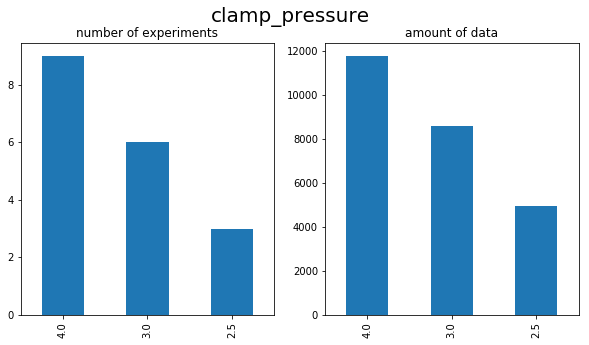

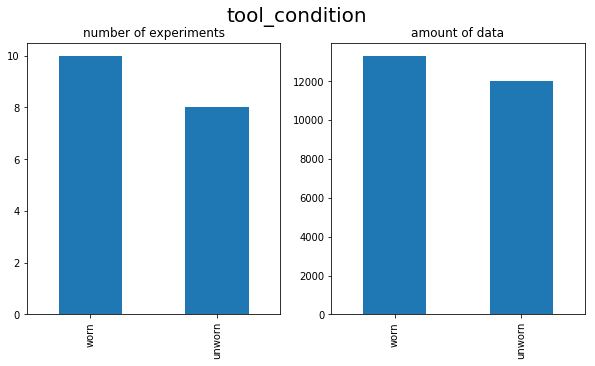

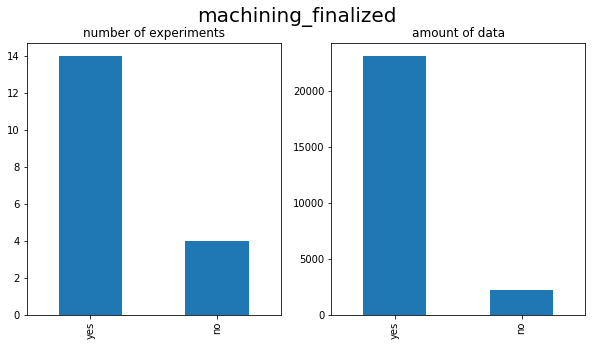

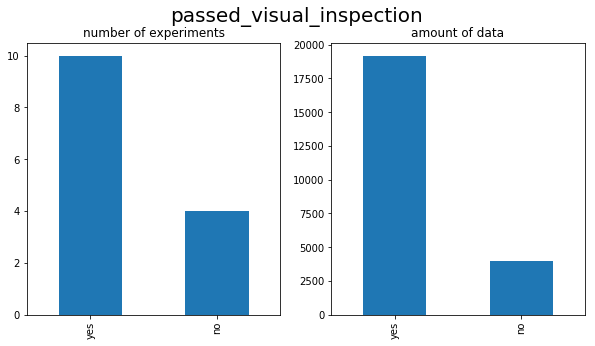

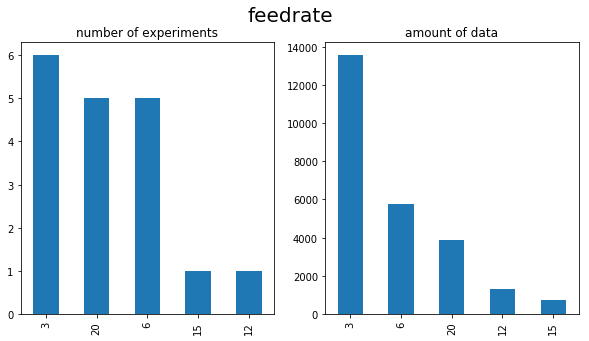

In [ ]:
list_columns = ['clamp_pressure', 'tool_condition', 'machining_finalized',
                'passed_visual_inspection', 'feedrate']
Value_counts_charts(list_columns)

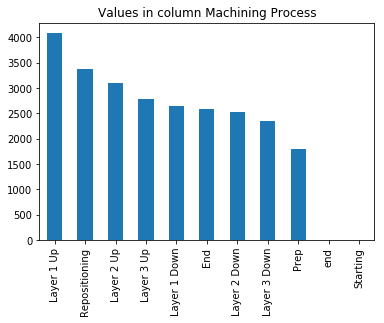

In [ ]:
df['Machining_Process'].value_counts().plot.bar()
plt.title('Values in column Machining Process')
plt.show()

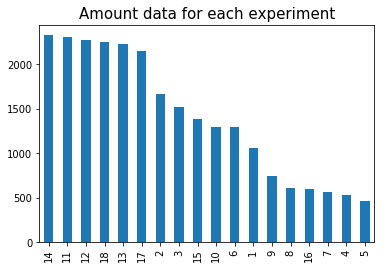

In [ ]:
df['No'].value_counts().plot.bar()
plt.title('Amount data for each experiment', fontsize=15)
plt.show()

In [ ]:
def show_tool_path(df, exp_num, dots):
  """ Function for show tool path in 2D and 3D chart
      with different color for each machining process """

  one_experiment = df.loc[df['No'] == exp_num]
  if dots == 'full':
    dots = one_experiment.shape[0]
  else:
    dots = dots

  def pltcolor(lst):
      """ Function for adding color for each machining process """
      cols=[]
      for l in lst:
          if l=='Prep':
              cols.append('black')
          elif l=='Repositioning':
              cols.append('green')
          elif l=='end':
              cols.append('red')
          elif l=='Starting':
              cols.append('red')
          else:
              cols.append('blue')
      return cols


  fig, ax = plt.subplots(1, 2, figsize=(20, 10))
  fig.suptitle('tool path', fontsize=20)

  ax = fig.add_subplot(1, 2, 1, projection='3d')
  ax.set_title("3D", fontsize=12)
  # axarr[0] = fig.gca(projection='3d')
  cols = pltcolor(one_experiment.Machining_Process)[:dots]
  z = one_experiment.Z1_ActualPosition[:dots]
  x = one_experiment.X1_ActualPosition[:dots]
  y = one_experiment.Y1_ActualPosition[:dots]

  ax.scatter3D(x, y, z, label='tool move', c=cols )
  ax.legend()

  ax1 = fig.add_subplot(1, 2, 2)
  ax1.set_title("2d", fontsize=12)
  x = one_experiment.X1_ActualPosition[:dots]
  y = one_experiment.Y1_ActualPosition[:dots]
  cols=pltcolor(one_experiment.Machining_Process)[:dots]


  ax1.scatter(x,y, label='tool move', c=cols)

  plt.show()

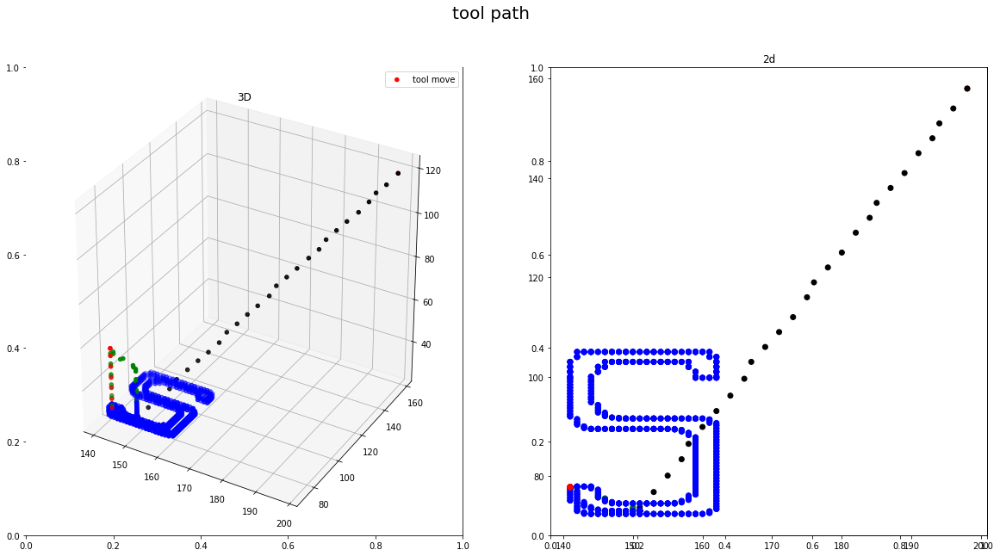

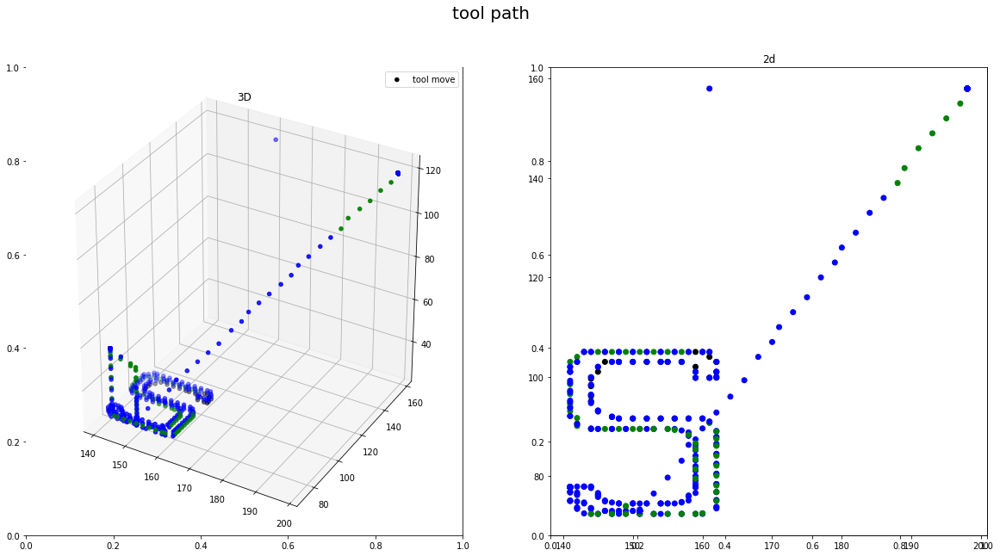

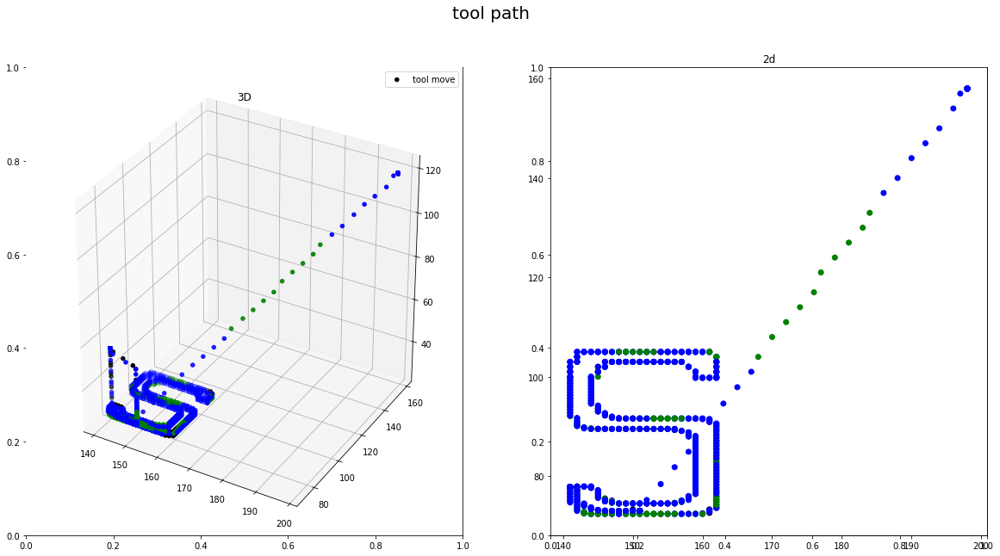

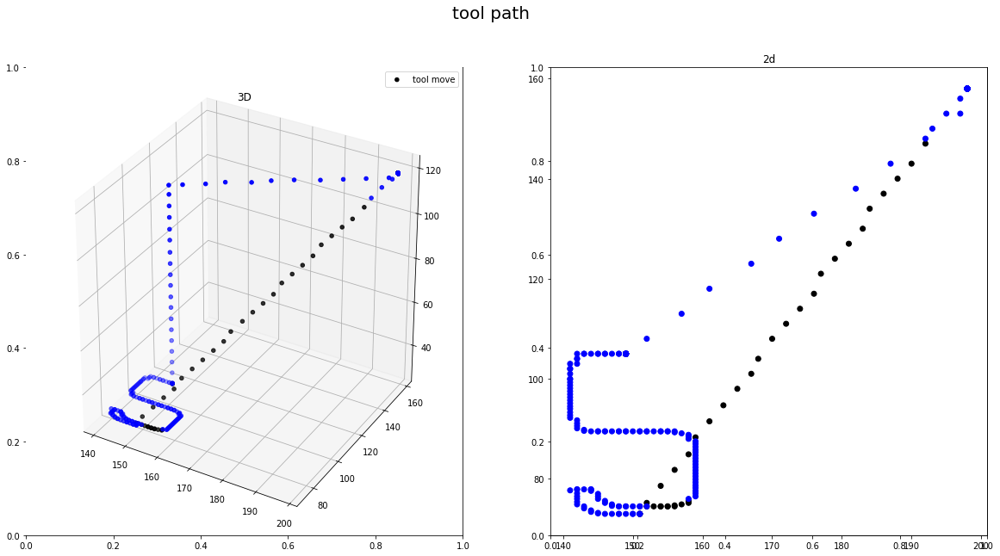

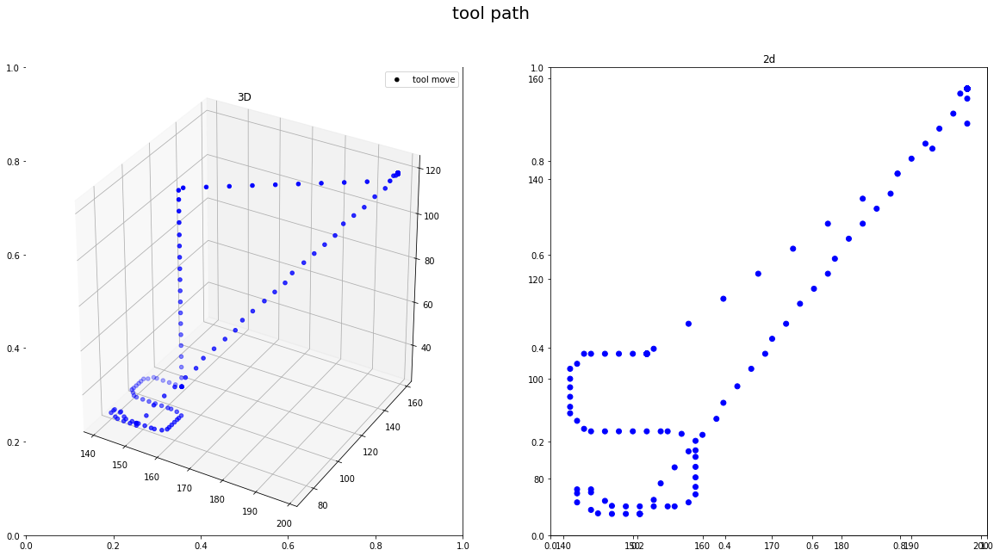

...

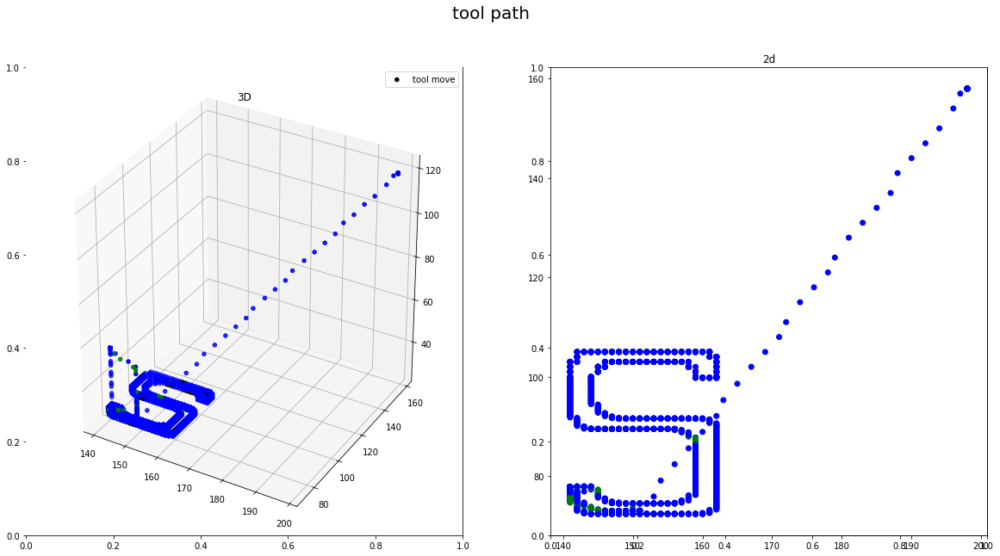

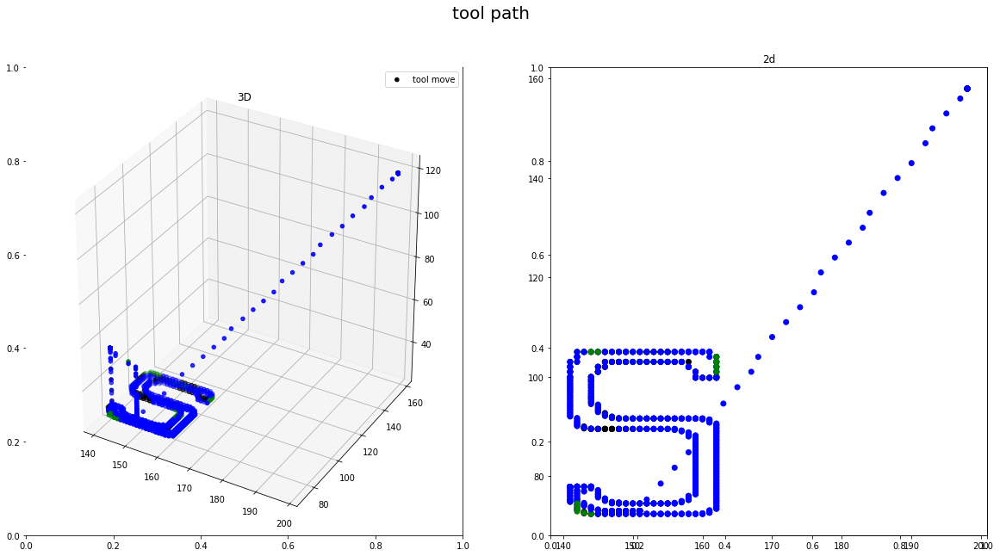

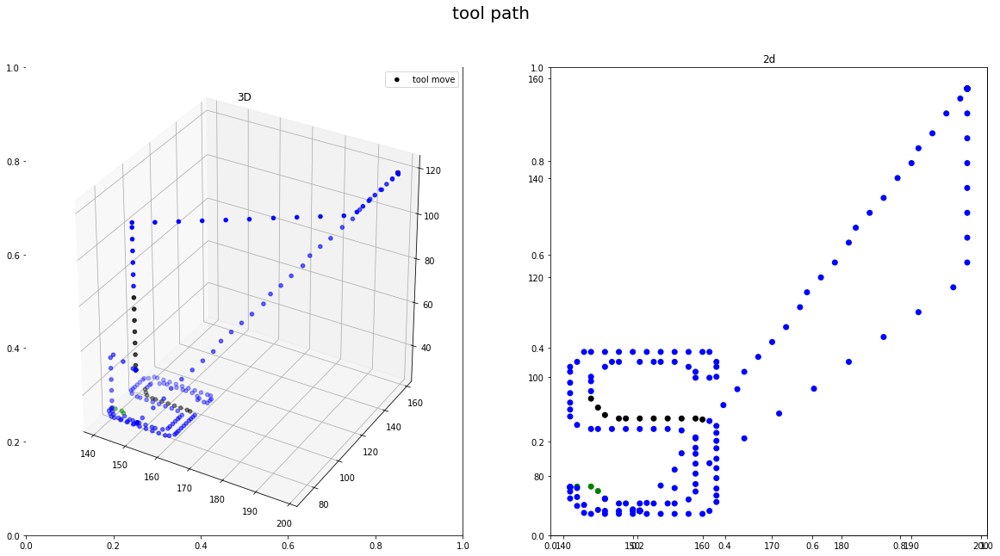

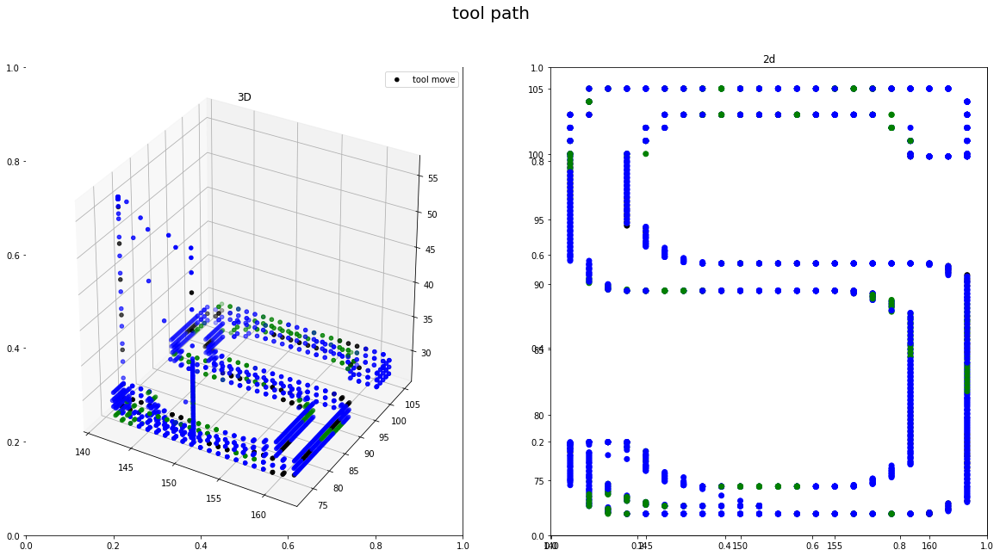

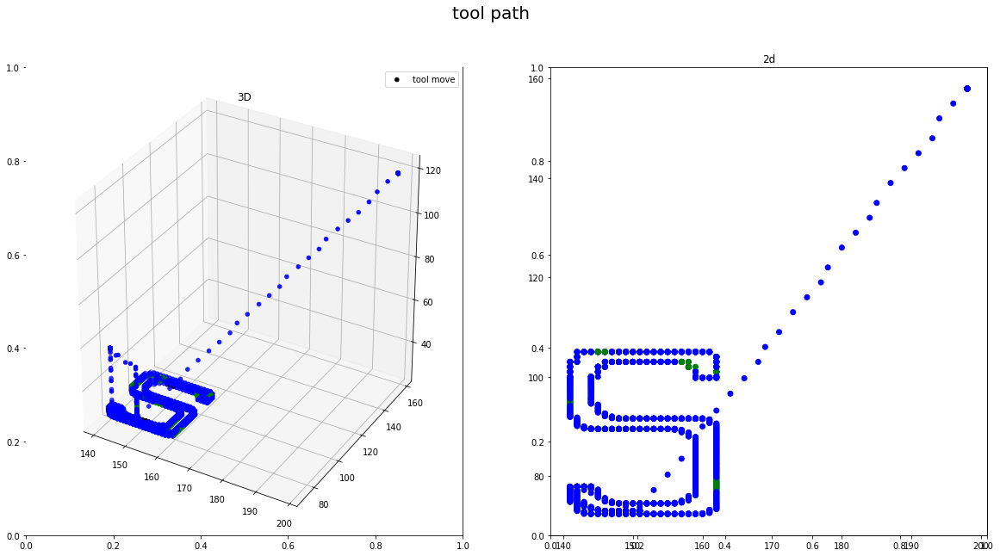

In [ ]:
for i in range(1,19):
  show_tool_path(df,i,'full')

In [ ]:
def Z_position_hist(df):
  ''' Function for draw histogram of tool position in Z-axis '''
  plt.hist(df.Z1_ActualPosition, bins=50)
  plt.title('Values in Z1_ActualPosition')
  plt.show()

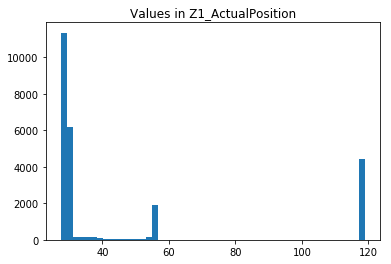

In [ ]:
Z_position_hist(df)

Create new columns with position difference in each axis

In [ ]:
df['X1_Position_difference'] = df['X1_ActualPosition'] - df['X1_CommandPosition']
df['Y1_Position_difference'] = df['Y1_ActualPosition'] - df['Y1_CommandPosition']
df['Z1_Position_difference'] = df['Z1_ActualPosition'] - df['Z1_CommandPosition']


In [ ]:
def show_Diffrences(df):
  '''Function for draw plot of differences between actual and command tool
     position in X,Y,Z axis'''
  fig, ax = plt.subplots(3, 1, figsize=(20, 15), sharex=True, sharey=True,)
  fig.suptitle('Differences between ActualPosition and CommandPosition',
               fontsize=20)

  ax1 = fig.add_subplot(3, 1, 1)
  ax1.set_title("Diffrences in X axsis", fontsize=15)
  ax1.plot(df['X1_Position_difference'])


  ax2 = fig.add_subplot(3, 1, 2)
  ax2.set_title("Diffrences in Y axsis", fontsize=15)
  ax2.plot(df['Y1_Position_difference'])

  ax3 = fig.add_subplot(3, 1, 3)
  ax3.set_title("Diffrences in Z axsis", fontsize=15)
  ax3.plot(df['X1_Position_difference'])

  plt.show()


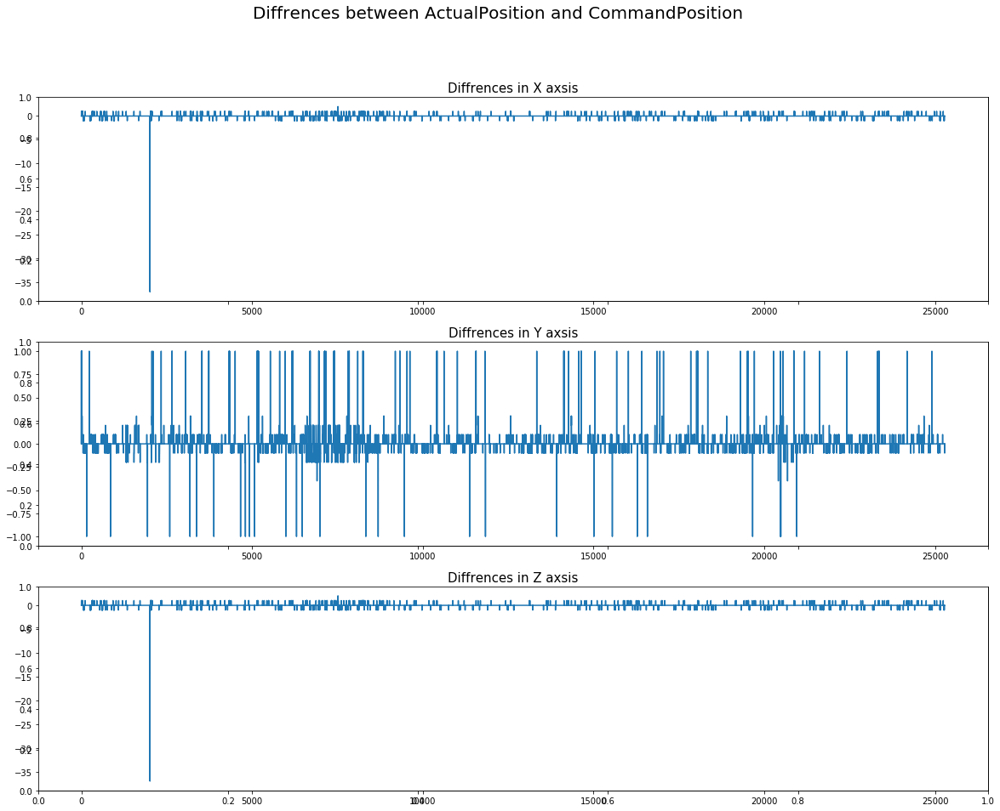

In [ ]:
show_Diffrences(df)

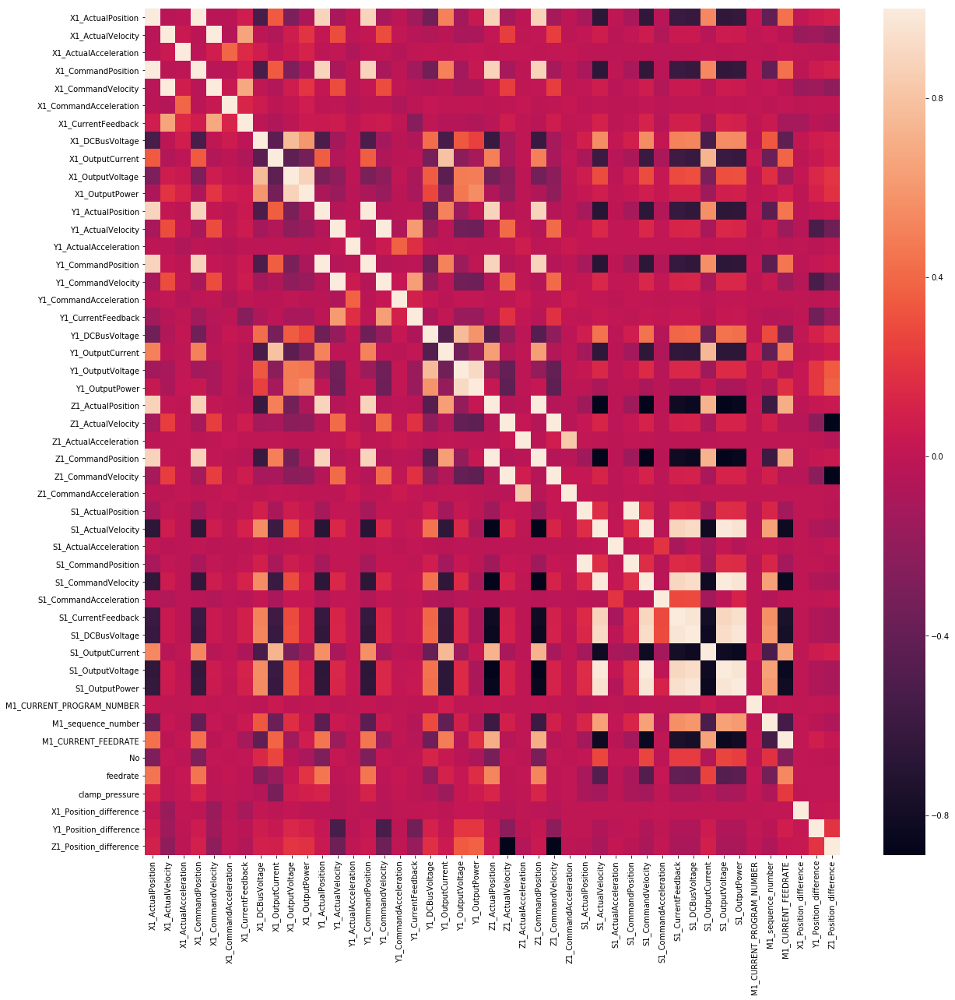

In [ ]:
df_correlation=df.corr()
df_correlation.dropna(thresh=1,inplace=True)
df_correlation.drop(columns=['Z1_CurrentFeedback','Z1_DCBusVoltage',
                             'Z1_OutputCurrent','Z1_OutputVoltage',
                             'S1_SystemInertia','clamp_pressure',
                             'feedrate', 'No'] ,inplace=True)
plt.figure(figsize=(20,20))
sns.heatmap(df_correlation)
plt.show()
#plt.savefig('heatmap.jpg')

# DATA CLEANING

**Creators of data sets says:**
<br> "Some variables will not accurately reflect the operation of the CNC machine. This can usually be detected by when M1_CURRENT_FEEDRATE reads 50, when X1 ActualPosition reads 198, or when M1_CURRENT_PROGRAM_NUMBER does not read 0. The source of these errors has not been identified."
<br>I deleted this data so that it would not lead to errors in the model.

In [ ]:
df_cleaned = df[~(df['M1_CURRENT_FEEDRATE'] == 50 )]
df_cleaned = df_cleaned[~(df_cleaned['X1_ActualPosition'] == 198 )]
df_cleaned = df_cleaned[~(df_cleaned['M1_CURRENT_PROGRAM_NUMBER'] != 0 )]

Delete data generated while spindle traveling. They are not needed in the learning model.

In [ ]:
df_cleaned = df[~(df['Z1_ActualPosition'] >= 30)]

Histogram with values in Z-axis after clean

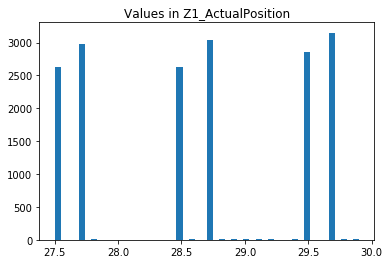

In [ ]:
Z_position_hist(df_cleaned)

In [ ]:
def show_tool_path_parms(df, exp_num, dots):
  ''' Function for draw 4 plots for selected experiment
      1. Plot of toolpath in 2d
      2. Plot of toolpath in 3d
      3. Bar plot of  amount of data in each machining process
      4. Histogram of tool position in Z-axis'''

  one_experiment = df.loc[df['No'] == exp_num]
  if dots == 'full':
    dots = one_experiment.shape[0]
  else:
    dots = dots

  def pltcolor(lst):
        """ Function for adding color for each machining process"""
        cols=[]
        for l in lst:
            if l=='Prep':
                cols.append('black')
            elif l=='Repositioning':
                cols.append('green')
            elif l=='end':
                cols.append('red')
            elif l=='Starting':
                cols.append('red')
            else:
                cols.append('blue')
        return cols


  fig, ax = plt.subplots(2, 2, figsize=(20, 20))
  fig.suptitle('Tool path params', fontsize=20)

  # 3d scatter plot.
  ax = fig.add_subplot(2, 2, 1, projection='3d')
  ax.set_title("3d  tool path", fontsize=12)
  cols = pltcolor(one_experiment.Machining_Process)[:dots]
  z = one_experiment.Z1_ActualPosition[:dots]
  x = one_experiment.X1_ActualPosition[:dots]
  y = one_experiment.Y1_ActualPosition[:dots]

  ax.scatter3D(x, y, z, label='tool move', c=cols )
  ax.legend()

  # 2d scatter polt.
  ax1 = fig.add_subplot(2, 2, 2)
  ax1.set_title("2d tool path", fontsize=12)
  x = one_experiment.X1_ActualPosition[:dots]
  y = one_experiment.Y1_ActualPosition[:dots]
  cols=pltcolor(one_experiment.Machining_Process)[:dots]
  ax1.scatter(x,y, label='tool move', c=cols)

  # Bar plot of values in machining process.
  ax2 = fig.add_subplot(2, 2, 3)
  ax2.set_title("Values in machining_Process", fontsize=12)
  df_cleaned['Machining_Process'].value_counts().plot.bar(ax = ax2)

  # Histogram of Z axis.
  ax3 = fig.add_subplot(2, 2, 4)
  ax3.set_title("Histogram of tool position in Z-axis", fontsize=12)
  ax3.hist(df_cleaned.Z1_ActualPosition, bins=50)


  plt.show()

Plots with tool path, values in machining_Process and histogram of Z axis for each experiment

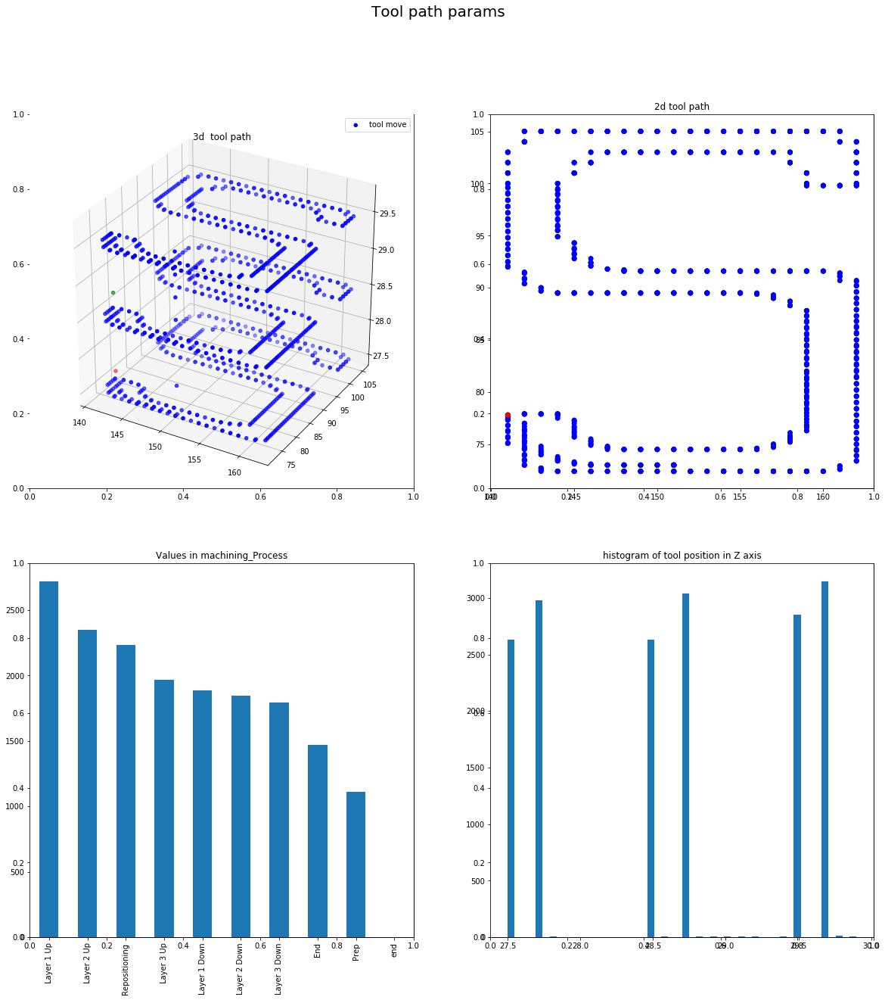

In [ ]:
show_tool_path_parms(df_cleaned,1,'full')

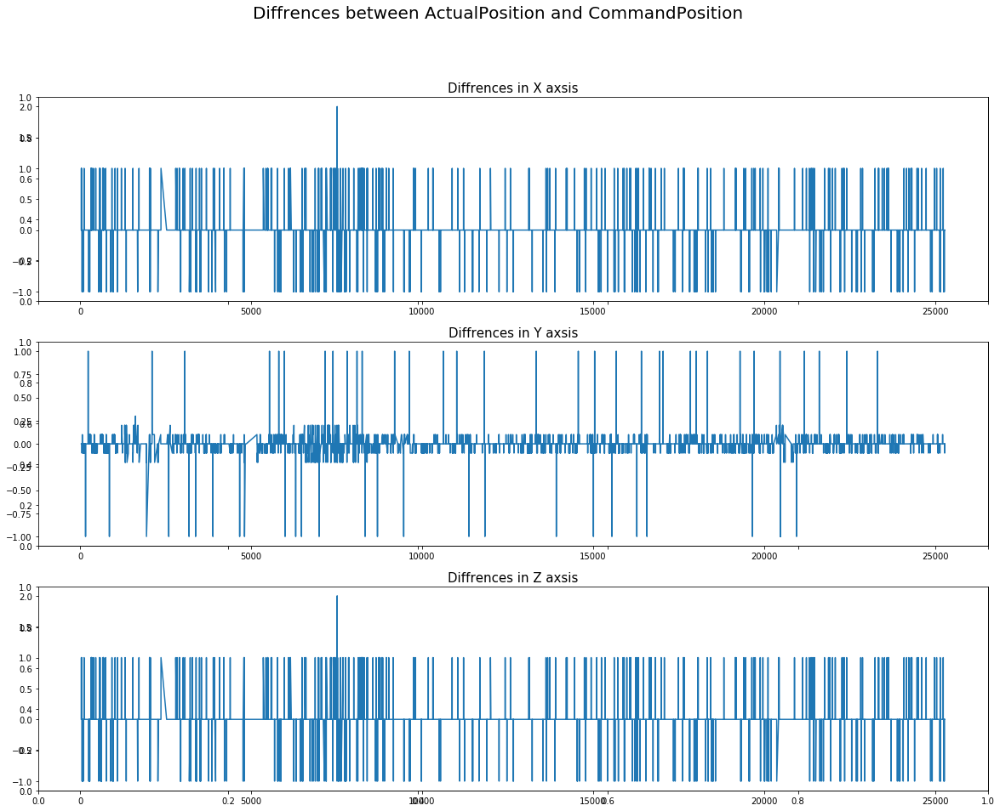

In [ ]:
show_Diffrences(df_cleaned)

In difrence columns are some outliers values, so i delete values more than 1 and less than 1.

In [ ]:

df_cleaned = df_cleaned[~(df_cleaned['X1_Position_difference'] < -1)]

df_cleaned = df_cleaned[~(df_cleaned['Y1_Position_difference'] > 1)]
df_cleaned = df_cleaned[~(df_cleaned['Y1_Position_difference'] < -1)]

df_cleaned = df_cleaned[~(df_cleaned['Z1_Position_difference'] > 1)]
df_cleaned = df_cleaned[~(df_cleaned['Z1_Position_difference'] < -1)]

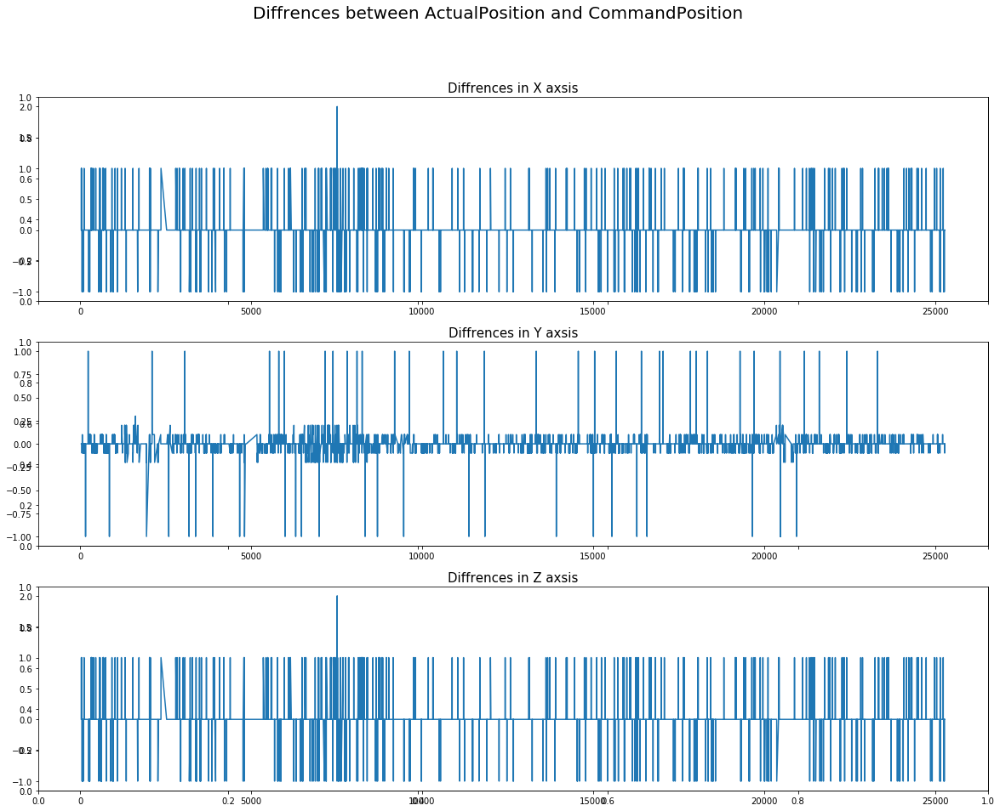

In [ ]:
show_Diffrences(df_cleaned)

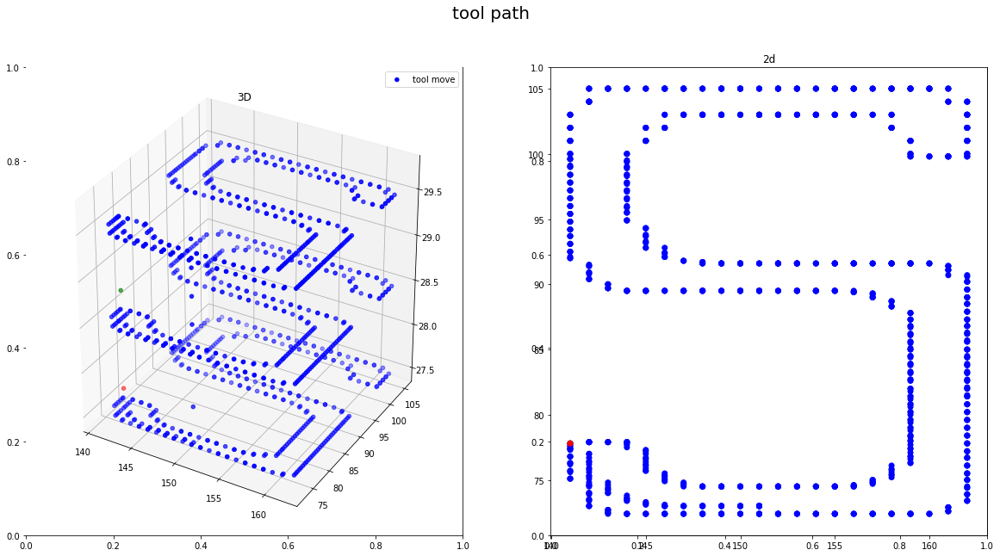

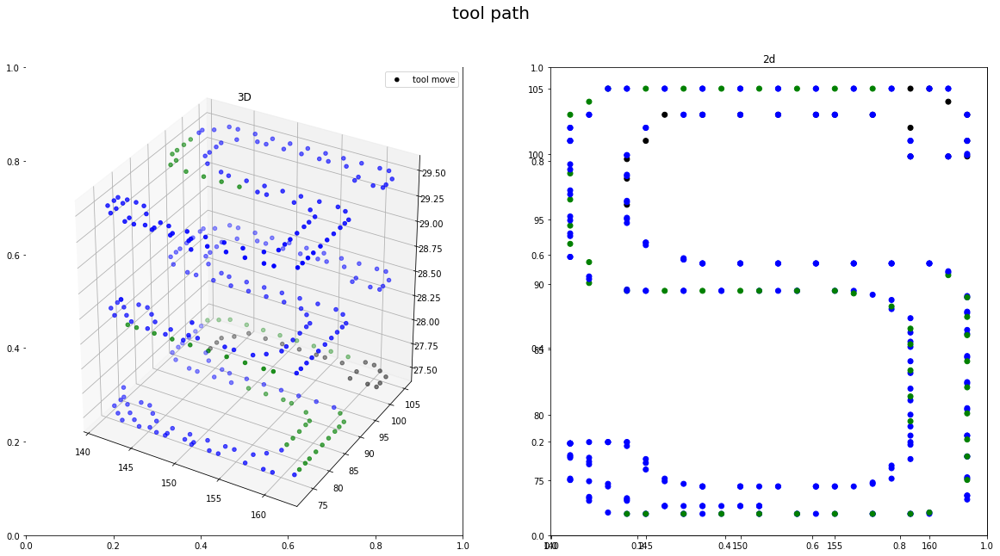

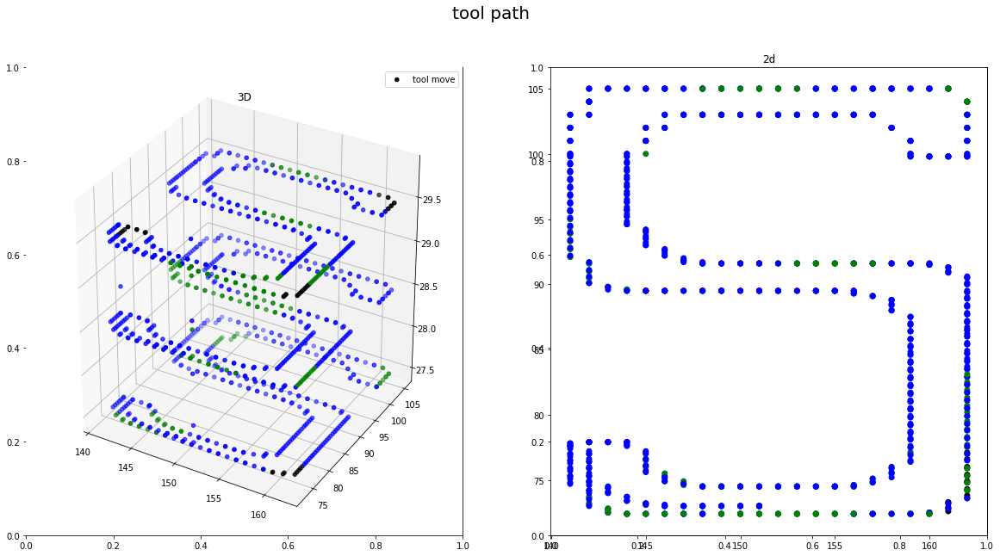

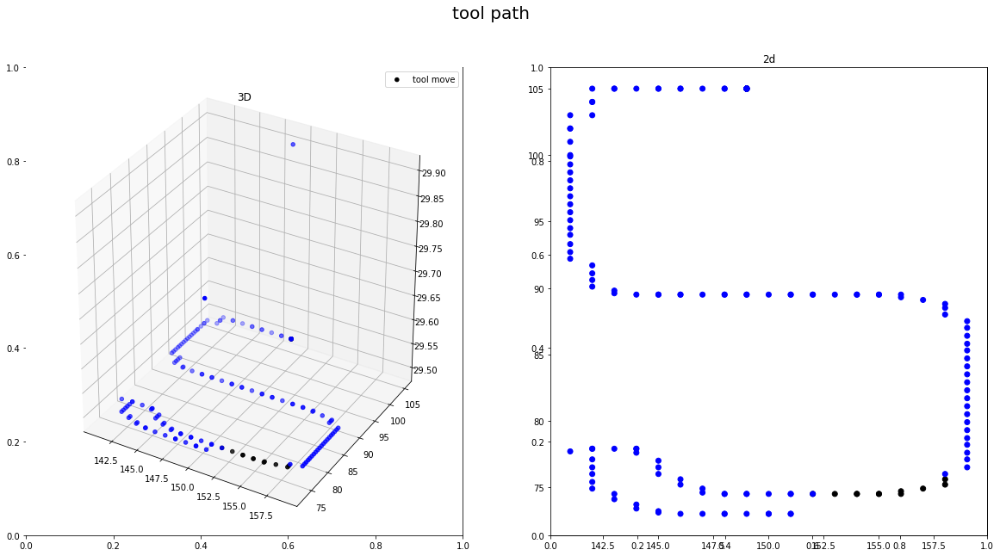

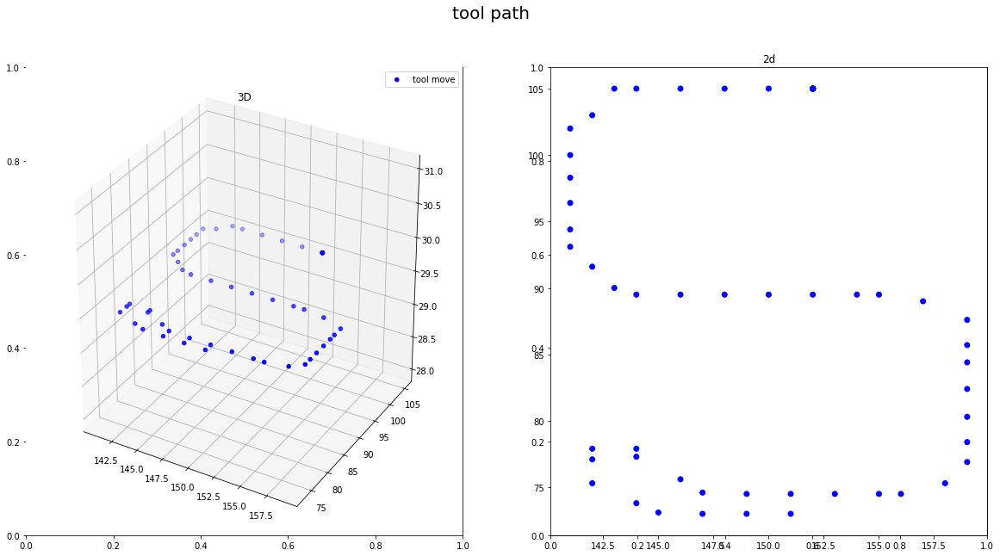

...

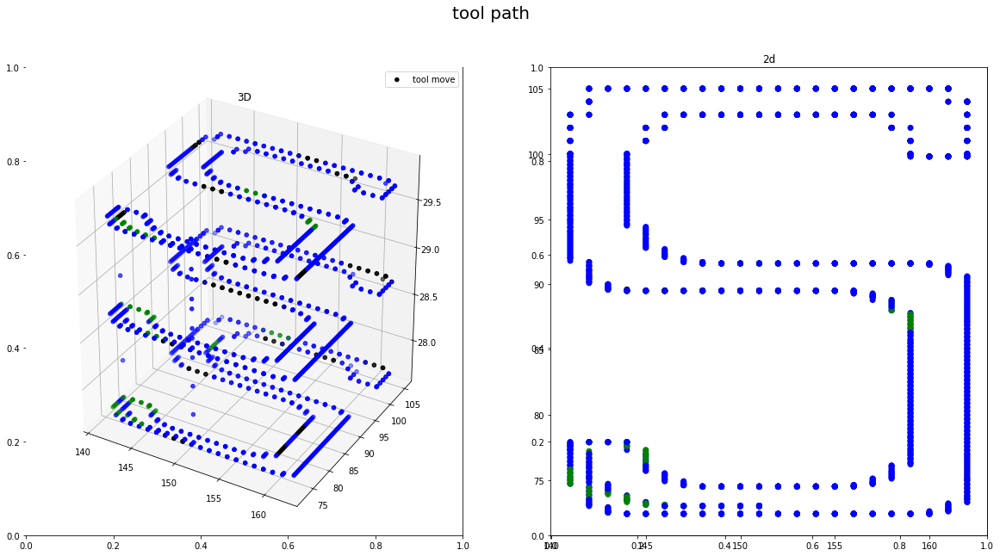

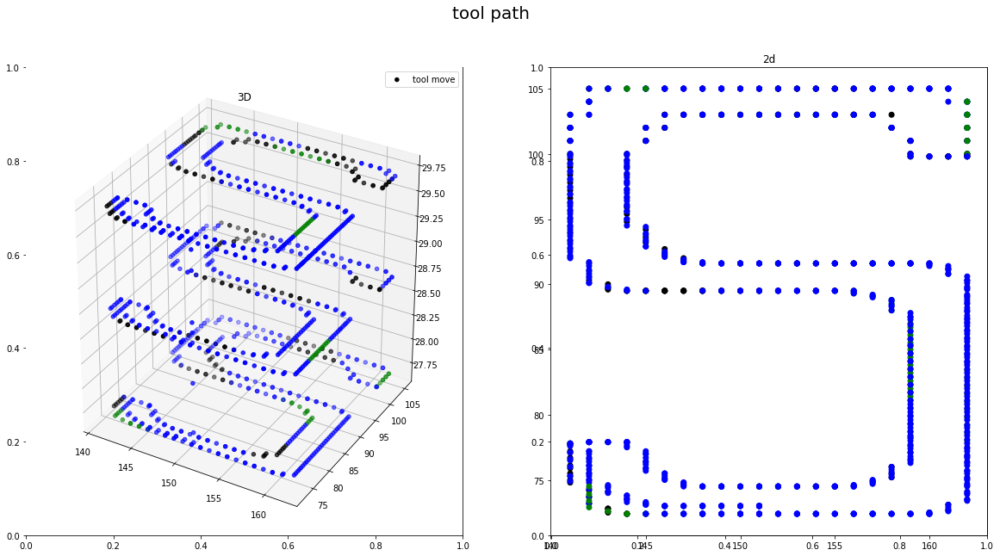

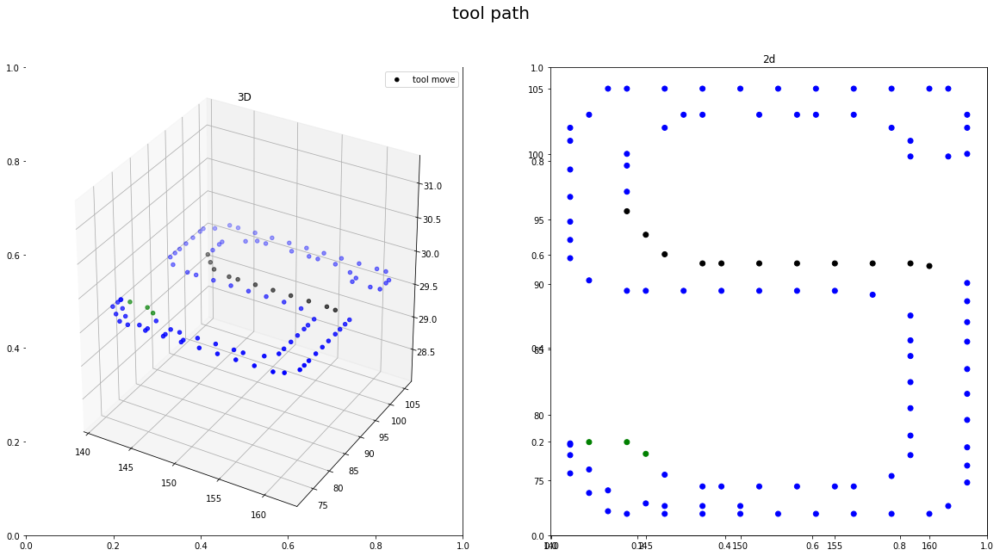

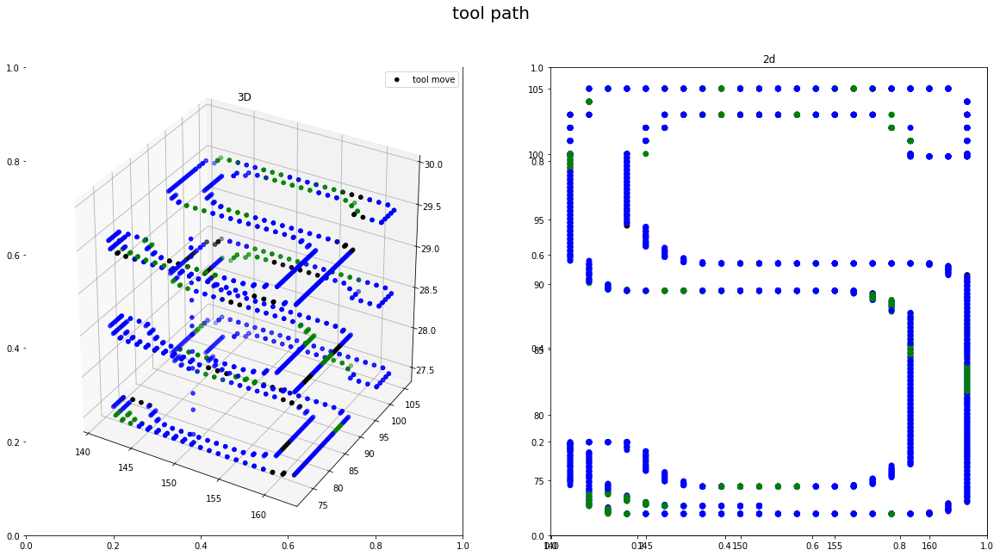

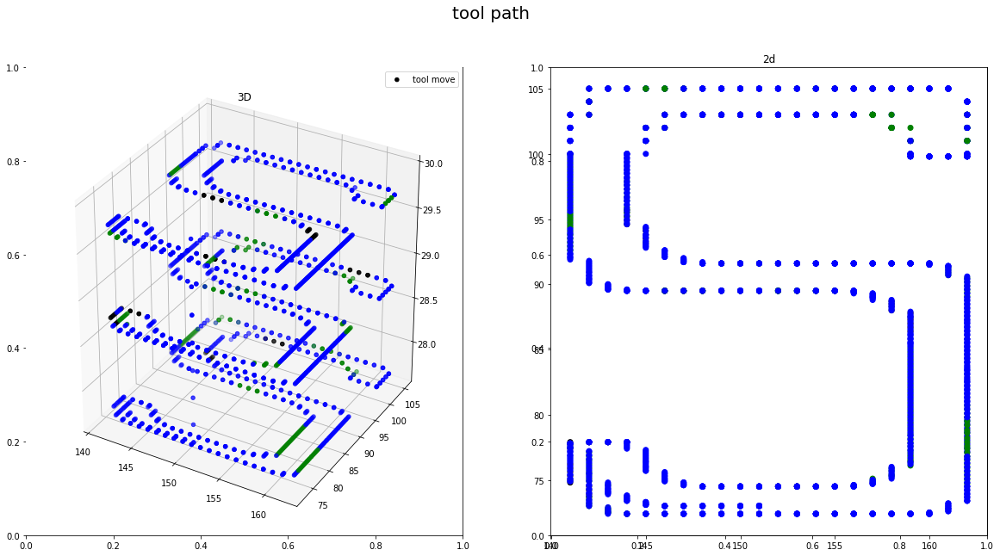

In [ ]:
for i in range(1,19):
  show_tool_path(df_cleaned,i,'full')

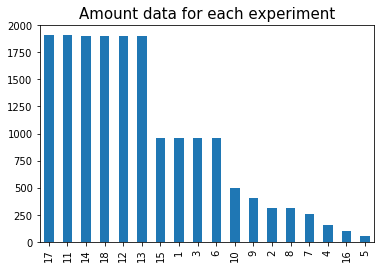

In [ ]:
df_cleaned['No'].value_counts().plot.bar()
plt.title('Amount data for each experiment', fontsize=15)
plt.show()

In [ ]:
results[['No', 'passed_visual_inspection']]

,No,passed_visual_inspection
0,1,yes
1,2,yes
2,3,yes
3,4,NaN
4,5,NaN
5,6,no
6,7,NaN
7,8,no
8,9,no
9,10,no


In [ ]:
df_cleaned = df_cleaned.fillna('no')

Change text values to binary values

In [ ]:
df_cleaned['passed_visual_inspection'] = df_cleaned['passed_visual_inspection'].map({'yes': 1, 'no': 0})
df_cleaned['target'] = df_cleaned['target'].map({'worn': 1, 'unworn': 0})
df_cleaned['tool_condition'] = df_cleaned['tool_condition'].map({'worn': 1, 'unworn': 0})
df_cleaned['machining_finalized'] = df_cleaned['machining_finalized'].map({'yes': 1, 'no': 0})

##  Preparing data for wear model

In [ ]:
df_cleaned.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,X1_OutputPower,Y1_ActualPosition,Y1_ActualVelocity,Y1_ActualAcceleration,Y1_CommandPosition,Y1_CommandVelocity,Y1_CommandAcceleration,Y1_CurrentFeedback,Y1_DCBusVoltage,Y1_OutputCurrent,Y1_OutputVoltage,Y1_OutputPower,Z1_ActualPosition,Z1_ActualVelocity,Z1_ActualAcceleration,Z1_CommandPosition,Z1_CommandVelocity,Z1_CommandAcceleration,Z1_CurrentFeedback,Z1_DCBusVoltage,Z1_OutputCurrent,Z1_OutputVoltage,S1_ActualPosition,S1_ActualVelocity,S1_ActualAcceleration,S1_CommandPosition,S1_CommandVelocity,S1_CommandAcceleration,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,S1_SystemInertia,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,No,material,feedrate,target,clamp_pressure,machining_finalized,passed_visual_inspection,tool_condition,X1_Position_difference,Y1_Position_difference,Z1_Position_difference
32,151.0,-0.075,-37.50,151.0,0.0,0.0,0.664,0.0332,325.0,4.3,0.000004,73.0,-0.075,-31.3,73.0,0.0,0.0,1.9800,0.0194,324.0,0.51,-0.000003,29.5,-5.8,-12.5,29.5,-2.67,778.0,0.0,0.0,0.0,0.0,-358.0,26.3,88.5,-358.0,27.0,1.000000e+02,54.70,2.410,317.0,72.8,0.2310,12.0,1.0,14.0,6.0,Layer 1 Up,1,wax,6,0,4.0,1,1,0,0.0,0.0,0.0
33,151.0,-6.000,6.25,150.0,-6.0,0.0,-8.100,0.0983,323.0,10.2,0.001260,73.0,0.050,25.0,73.0,0.0,0.0,-0.0991,0.0258,322.0,1.10,0.000002,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-355.0,35.9,98.9,-354.0,36.6,1.000000e+02,62.00,2.610,309.0,88.4,0.3410,12.0,1.0,14.0,6.0,Layer 1 Up,1,wax,6,0,4.0,1,1,0,1.0,0.0,0.0
34,150.0,-6.150,-43.80,150.0,-6.0,0.0,-6.420,0.1010,322.0,11.5,0.001260,73.0,0.050,18.8,73.0,0.0,0.0,0.2200,0.0340,322.0,1.29,-0.000004,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-351.0,45.9,125.0,-350.0,46.6,1.000000e+02,59.00,2.650,306.0,109.0,0.4410,12.0,1.0,14.0,6.0,Layer 1 Up,1,wax,6,0,4.0,1,1,0,0.0,0.0,0.0
35,149.0,-5.930,62.50,149.0,-6.0,0.0,-6.670,0.0980,325.0,14.2,0.001180,73.0,-0.100,-50.0,73.0,0.0,0.0,1.1800,0.0209,324.0,2.25,-0.000001,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-345.0,53.7,-51.0,-345.0,53.3,-9.540000e-07,9.37,0.389,324.0,112.0,0.0746,12.0,1.0,14.0,6.0,Layer 1 Up,1,wax,6,0,4.0,1,1,0,0.0,0.0,0.0
36,149.0,-5.930,-12.50,149.0,-6.0,0.0,-5.990,0.1130,325.0,13.6,0.001440,73.0,0.050,31.3,73.0,0.0,0.0,-5.3700,0.0413,325.0,8.21,0.000000,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-340.0,53.2,-54.8,-340.0,53.3,0.000000e+00,27.30,1.200,320.0,117.0,0.2310,12.0,1.0,14.0,6.0,Layer 1 Up,1,wax,6,0,4.0,1,1,0,0.0,0.0,0.0


In [ ]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17383 entries, 32 to 25285
Data columns (total 59 columns):
X1_ActualPosition            17383 non-null float64
X1_ActualVelocity            17383 non-null float64
X1_ActualAcceleration        17383 non-null float64
X1_CommandPosition           17383 non-null float64
X1_CommandVelocity           17383 non-null float64
X1_CommandAcceleration       17383 non-null float64
X1_CurrentFeedback           17383 non-null float64
X1_DCBusVoltage              17383 non-null float64
X1_OutputCurrent             17383 non-null float64
X1_OutputVoltage             17383 non-null float64
X1_OutputPower               17383 non-null float64
Y1_ActualPosition            17383 non-null float64
Y1_ActualVelocity            17383 non-null float64
Y1_ActualAcceleration        17383 non-null float64
Y1_CommandPosition           17383 non-null float64
Y1_CommandVelocity           17383 non-null float64
Y1_CommandAcceleration       17383 non-null float64
Y1_Cur

I decide to delete data were passed visual inspection is equal 0, because if machining was not passed visual inspection it's mean that, detail was mounted with not enough force. So it could move or vibrate, which could affect the data acquisition.

In [ ]:
df_wear = df_cleaned[~(df_cleaned['passed_visual_inspection'] == 0)]

 Drop columns with useless or dangerous data for machine learning.






In [ ]:
df_wear.drop(columns=['material', 'No', 'Machining_Process',
                       'clamp_pressure', 'machining_finalized',
                       'passed_visual_inspection',
                       'tool_condition', 'M1_CURRENT_PROGRAM_NUMBER'],
              inplace=True, axis=1)

In [ ]:
df_wear.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,X1_OutputPower,Y1_ActualPosition,Y1_ActualVelocity,Y1_ActualAcceleration,Y1_CommandPosition,Y1_CommandVelocity,Y1_CommandAcceleration,Y1_CurrentFeedback,Y1_DCBusVoltage,Y1_OutputCurrent,Y1_OutputVoltage,Y1_OutputPower,Z1_ActualPosition,Z1_ActualVelocity,Z1_ActualAcceleration,Z1_CommandPosition,Z1_CommandVelocity,Z1_CommandAcceleration,Z1_CurrentFeedback,Z1_DCBusVoltage,Z1_OutputCurrent,Z1_OutputVoltage,S1_ActualPosition,S1_ActualVelocity,S1_ActualAcceleration,S1_CommandPosition,S1_CommandVelocity,S1_CommandAcceleration,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,S1_SystemInertia,M1_sequence_number,M1_CURRENT_FEEDRATE,feedrate,target,X1_Position_difference,Y1_Position_difference,Z1_Position_difference
32,151.0,-0.075,-37.50,151.0,0.0,0.0,0.664,0.0332,325.0,4.3,0.000004,73.0,-0.075,-31.3,73.0,0.0,0.0,1.9800,0.0194,324.0,0.51,-0.000003,29.5,-5.8,-12.5,29.5,-2.67,778.0,0.0,0.0,0.0,0.0,-358.0,26.3,88.5,-358.0,27.0,1.000000e+02,54.70,2.410,317.0,72.8,0.2310,12.0,14.0,6.0,6,0,0.0,0.0,0.0
33,151.0,-6.000,6.25,150.0,-6.0,0.0,-8.100,0.0983,323.0,10.2,0.001260,73.0,0.050,25.0,73.0,0.0,0.0,-0.0991,0.0258,322.0,1.10,0.000002,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-355.0,35.9,98.9,-354.0,36.6,1.000000e+02,62.00,2.610,309.0,88.4,0.3410,12.0,14.0,6.0,6,0,1.0,0.0,0.0
34,150.0,-6.150,-43.80,150.0,-6.0,0.0,-6.420,0.1010,322.0,11.5,0.001260,73.0,0.050,18.8,73.0,0.0,0.0,0.2200,0.0340,322.0,1.29,-0.000004,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-351.0,45.9,125.0,-350.0,46.6,1.000000e+02,59.00,2.650,306.0,109.0,0.4410,12.0,14.0,6.0,6,0,0.0,0.0,0.0
35,149.0,-5.930,62.50,149.0,-6.0,0.0,-6.670,0.0980,325.0,14.2,0.001180,73.0,-0.100,-50.0,73.0,0.0,0.0,1.1800,0.0209,324.0,2.25,-0.000001,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-345.0,53.7,-51.0,-345.0,53.3,-9.540000e-07,9.37,0.389,324.0,112.0,0.0746,12.0,14.0,6.0,6,0,0.0,0.0,0.0
36,149.0,-5.930,-12.50,149.0,-6.0,0.0,-5.990,0.1130,325.0,13.6,0.001440,73.0,0.050,31.3,73.0,0.0,0.0,-5.3700,0.0413,325.0,8.21,0.000000,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-340.0,53.2,-54.8,-340.0,53.3,0.000000e+00,27.30,1.200,320.0,117.0,0.2310,12.0,14.0,6.0,6,0,0.0,0.0,0.0


In [ ]:
df_wear.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14623 entries, 32 to 25285
Data columns (total 51 columns):
X1_ActualPosition         14623 non-null float64
X1_ActualVelocity         14623 non-null float64
X1_ActualAcceleration     14623 non-null float64
X1_CommandPosition        14623 non-null float64
X1_CommandVelocity        14623 non-null float64
X1_CommandAcceleration    14623 non-null float64
X1_CurrentFeedback        14623 non-null float64
X1_DCBusVoltage           14623 non-null float64
X1_OutputCurrent          14623 non-null float64
X1_OutputVoltage          14623 non-null float64
X1_OutputPower            14623 non-null float64
Y1_ActualPosition         14623 non-null float64
Y1_ActualVelocity         14623 non-null float64
Y1_ActualAcceleration     14623 non-null float64
Y1_CommandPosition        14623 non-null float64
Y1_CommandVelocity        14623 non-null float64
Y1_CommandAcceleration    14623 non-null float64
Y1_CurrentFeedback        14623 non-null float64
Y1_DCBus

# Model for wear detection

In [ ]:
X = df_wear.drop(columns='target',axis=1)
y = np.array(df_wear['target'])

X_display = X
y_display = y

In [ ]:
# make a validation dataset
X_train,X_val,y_train,y_val = train_test_split(X,y,
                                               train_size=0.8,
                                               random_state=100)
# make a test dataset
X_train,X_test,y_train,y_test = train_test_split(X_train,y_train,
                                                 train_size=0.95,
                                                 random_state=100)

In [ ]:
xgb_model=XGBClassifier()
xgb_model.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
def Accuracy(model ,X_val, X_test, y_val, y_test):
  '''Function for print accuracy on validation and test dataset'''
  y_pred_val = model.predict(X_val)
  auc_val = roc_auc_score(y_val, y_pred_val)
  y_pred_test = model.predict(X_test)
  auc_test = roc_auc_score(y_test, y_pred_test)
  print('Quantity of validation data set:', len(y_val))
  print('Accuracy on validation data set:', auc_val)
  print('Quantity of test data set:', len(y_test))
  print('Accuracy on test data set:', auc_test)


In [ ]:
Accuracy(xgb_model,X_val, X_test, y_val, y_test)

Ammout of validation data set: 2925
Accuracy on validation data set: 0.997909685281091
Ammout of test data set: 585
Accuracy on test data set: 0.9934546615581098


Acuracy score on val and test dataset are simlar so owerfiting did not occur.

### Features importanses exploration.

In [ ]:
features = [(df.columns[i], v) for i,v in enumerate(xgb_model.feature_importances_)]
features.sort(key=lambda x: x[1], reverse = True)
for item in features[:10]:
    print("{0}: {1:0.4f}".format(item[0], item[1]))

Z1_CommandPosition: 0.4513
Z1_ActualPosition: 0.3779
X1_OutputCurrent: 0.0777
Z1_CommandVelocity: 0.0094
X1_OutputPower: 0.0091
material: 0.0091
Z1_ActualVelocity: 0.0088
X1_DCBusVoltage: 0.0079
M1_CURRENT_PROGRAM_NUMBER: 0.0073
Y1_OutputCurrent: 0.0073


In [ ]:
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_val)

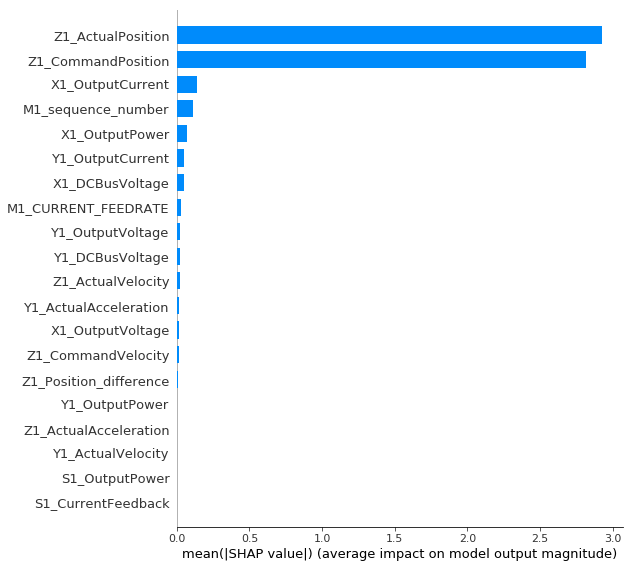

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [ ]:
def draw_roc(actual, probs):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

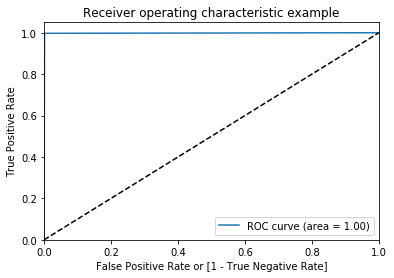

(array([0.        , 0.00130293, 1.        ]),
 array([0.       , 0.9971223, 1.       ]),
 array([2, 1, 0]))

In [ ]:
y_pred = xgb_model.predict(X_val)
draw_roc(y_val,y_pred)

Shapley additive explanations

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_val.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_val)

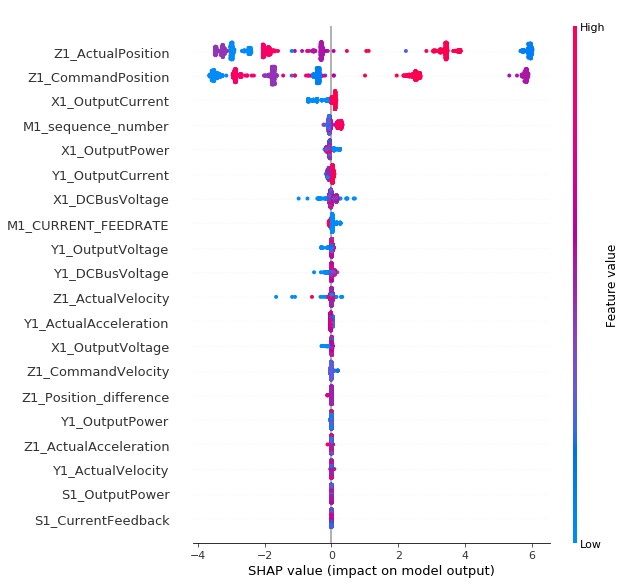

In [ ]:
shap.summary_plot(shap_values, X_val)

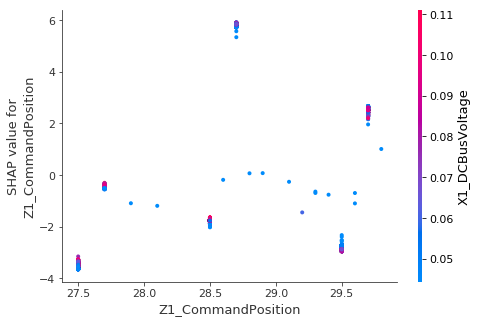

In [ ]:
shap.dependence_plot("Z1_CommandPosition", shap_values, X_val)

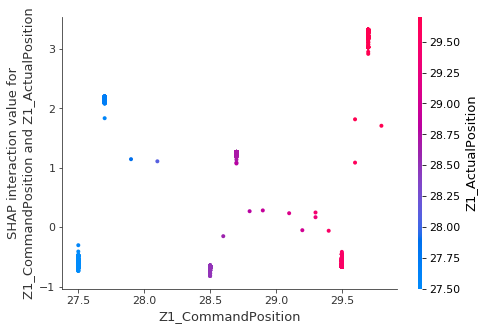

In [ ]:
shap.initjs()
shap_interaction_values = shap.TreeExplainer(xgb_model).shap_interaction_values(X_val.iloc[:,:])

shap.dependence_plot(
    ("Z1_CommandPosition", "Z1_ActualPosition"),
    shap_interaction_values, X_val,
    display_features=X_val
)

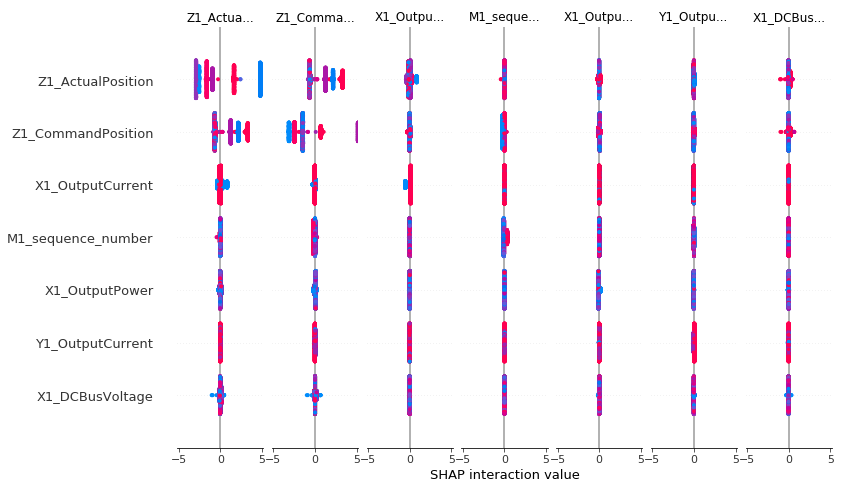

In [ ]:
shap.summary_plot(shap_interaction_values, X_val)

### Conclusions from SHAP Analysis
**Z1_CommandPosition and Z1_ActualPosition :**  are closely related because they represent the real-time and intended positions of the CNC machine's tool along the Z-axis, respectively. The dependency between these two features is critical for assessing the accuracy and precision of the machining process. Ideally, the actual position (Z1_ActualPosition) should closely match the commanded position (Z1_CommandPosition). Any significant deviation between these two positions can indicate potential issues such as tool deflection, mechanical errors, or improper calibration. For instance, if Z1_ActualPosition is consistently lower or higher than Z1_CommandPosition, it may suggest that the tool is not reaching the desired depth, which can affect the quality of the machined part and increase tool wear.


# Inadequate clamping force model


In [ ]:
df_clamping = df_cleaned

In [ ]:
df_clamping.drop(columns=['material', 'No', 'Machining_Process',
                          'machining_finalized', 'tool_condition',
                          'M1_CURRENT_PROGRAM_NUMBER',
                         ],
                 inplace=True, axis=1)

In [ ]:
df_clamping.head()


,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,X1_OutputPower,Y1_ActualPosition,Y1_ActualVelocity,Y1_ActualAcceleration,Y1_CommandPosition,Y1_CommandVelocity,Y1_CommandAcceleration,Y1_CurrentFeedback,Y1_DCBusVoltage,Y1_OutputCurrent,Y1_OutputVoltage,Y1_OutputPower,Z1_ActualPosition,Z1_ActualVelocity,Z1_ActualAcceleration,Z1_CommandPosition,Z1_CommandVelocity,Z1_CommandAcceleration,Z1_CurrentFeedback,Z1_DCBusVoltage,Z1_OutputCurrent,Z1_OutputVoltage,S1_ActualPosition,S1_ActualVelocity,S1_ActualAcceleration,S1_CommandPosition,S1_CommandVelocity,S1_CommandAcceleration,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,S1_SystemInertia,M1_sequence_number,M1_CURRENT_FEEDRATE,feedrate,target,clamp_pressure,passed_visual_inspection,X1_Position_difference,Y1_Position_difference,Z1_Position_difference
32,151.0,-0.075,-37.50,151.0,0.0,0.0,0.664,0.0332,325.0,4.3,0.000004,73.0,-0.075,-31.3,73.0,0.0,0.0,1.9800,0.0194,324.0,0.51,-0.000003,29.5,-5.8,-12.5,29.5,-2.67,778.0,0.0,0.0,0.0,0.0,-358.0,26.3,88.5,-358.0,27.0,1.000000e+02,54.70,2.410,317.0,72.8,0.2310,12.0,14.0,6.0,6,0,4.0,1,0.0,0.0,0.0
33,151.0,-6.000,6.25,150.0,-6.0,0.0,-8.100,0.0983,323.0,10.2,0.001260,73.0,0.050,25.0,73.0,0.0,0.0,-0.0991,0.0258,322.0,1.10,0.000002,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-355.0,35.9,98.9,-354.0,36.6,1.000000e+02,62.00,2.610,309.0,88.4,0.3410,12.0,14.0,6.0,6,0,4.0,1,1.0,0.0,0.0
34,150.0,-6.150,-43.80,150.0,-6.0,0.0,-6.420,0.1010,322.0,11.5,0.001260,73.0,0.050,18.8,73.0,0.0,0.0,0.2200,0.0340,322.0,1.29,-0.000004,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-351.0,45.9,125.0,-350.0,46.6,1.000000e+02,59.00,2.650,306.0,109.0,0.4410,12.0,14.0,6.0,6,0,4.0,1,0.0,0.0,0.0
35,149.0,-5.930,62.50,149.0,-6.0,0.0,-6.670,0.0980,325.0,14.2,0.001180,73.0,-0.100,-50.0,73.0,0.0,0.0,1.1800,0.0209,324.0,2.25,-0.000001,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-345.0,53.7,-51.0,-345.0,53.3,-9.540000e-07,9.37,0.389,324.0,112.0,0.0746,12.0,14.0,6.0,6,0,4.0,1,0.0,0.0,0.0
36,149.0,-5.930,-12.50,149.0,-6.0,0.0,-5.990,0.1130,325.0,13.6,0.001440,73.0,0.050,31.3,73.0,0.0,0.0,-5.3700,0.0413,325.0,8.21,0.000000,29.5,0.0,0.0,29.5,0.00,0.0,0.0,0.0,0.0,0.0,-340.0,53.2,-54.8,-340.0,53.3,0.000000e+00,27.30,1.200,320.0,117.0,0.2310,12.0,14.0,6.0,6,0,4.0,1,0.0,0.0,0.0


In [ ]:
X_clamp = df_clamping.drop(columns='passed_visual_inspection',axis=1)
y_clamp = np.array(df_clamping['passed_visual_inspection'])

X_display_clamp = X_clamp
y_display_clamp = y_clamp

In [ ]:
X_train_clamp,X_val_clamp,y_train_clamp,y_val_clamp = train_test_split(X_clamp,y_clamp,
                                                                         train_size=0.8,
                                                                         random_state=100)

X_train_clamp,X_test_clamp,y_train_clamp,y_test_clamp = train_test_split(X_train_clamp,y_train_clamp,
                                                                         train_size=0.95,
                                                                         random_state=100)

In [ ]:
xgb_clamp=XGBClassifier()
xgb_clamp.fit(X_train_clamp,y_train_clamp)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
y_pred_clamp = xgb_clamp.predict(X_val_clamp)
auc = roc_auc_score(y_val_clamp, y_pred_clamp)
print(auc)

1.0


In [ ]:
features = [(df.columns[i], v) for i,v in enumerate(xgb_clamp.feature_importances_)]
features.sort(key=lambda x: x[1], reverse = True)
for item in features[:10]:
    print("{0}: {1:0.4f}".format(item[0], item[1]))

X1_OutputCurrent: 0.6567
Machining_Process: 0.0645
Y1_OutputCurrent: 0.0580
Z1_ActualPosition: 0.0483
M1_sequence_number: 0.0348
No: 0.0343
M1_CURRENT_FEEDRATE: 0.0332
S1_ActualPosition: 0.0252
Y1_ActualVelocity: 0.0127
S1_OutputCurrent: 0.0117


In [ ]:
def Accuracy(X_val, X_test, y_val, y_test):
  y_pred_val = xgb_clamp.predict(X_val)
  auc_val = roc_auc_score(y_val, y_pred_val)
  y_pred_test = xgb_clamp.predict(X_test)
  auc_test = roc_auc_score(y_test, y_pred_test)
  print('Ammout of validation data set:', len(y_val))
  print('Accuracy on validation data set:', auc_val)
  print('Ammout of test data set:', len(y_test))
  print('Accuracy on test data set:', auc_test)


In [ ]:
Accuracy(X_val_clamp, X_test_clamp, y_val_clamp, y_test_clamp)

Ammout of validation data set: 3477
Accuracy on validation data set: 1.0
Ammout of test data set: 696
Accuracy on test data set: 1.0


In [ ]:
Accuracy(X_val_clamp, X_test_clamp, y_val_clamp, y_test_clamp)

Ammout of validation data set: 3477
Accuracy on validation data set: 1.0
Ammout of test data set: 696
Accuracy on test data set: 1.0


In [ ]:
explainer = shap.TreeExplainer(xgb_clamp)
shap_values_clamp = explainer.shap_values(X_val_clamp)

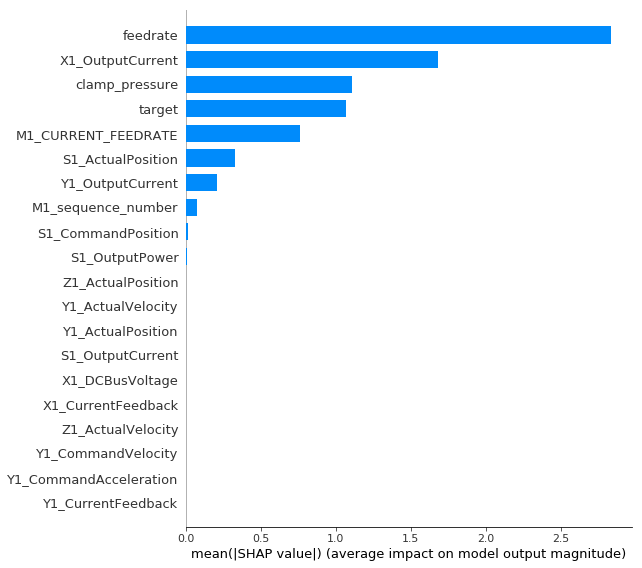

In [ ]:
shap.initjs()
shap.summary_plot(shap_values_clamp, X_val_clamp, plot_type="bar")

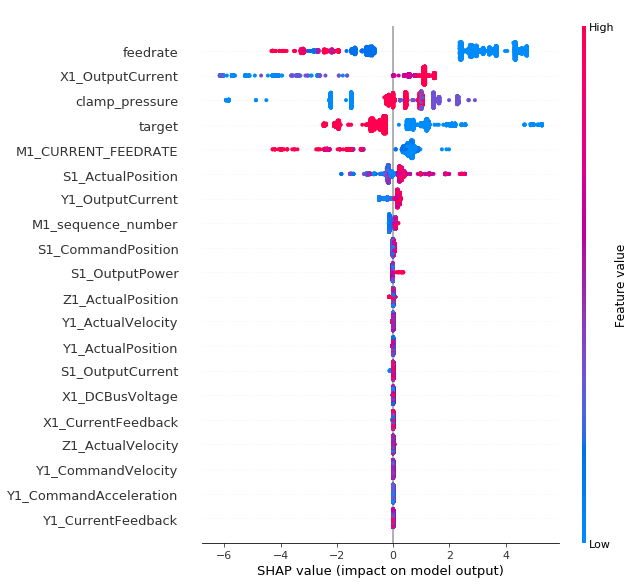

In [ ]:
shap.summary_plot(shap_values_clamp, X_val_clamp)

##Conclusions from SHAP Analysis
The SHAP plots help us understand which features are most important in predicting if the CNC machine clamping force is good or bad. Here are the conclusions:

###Feature Importance
**Feedrate:** This is the most important feature. It has the biggest effect on the model's prediction about the clamping force.
<br>**X1_OutputCurrent:** This is the output current in the X-axis. It has a strong impact on the model's prediction.
<br>**Clamp Pressure:** The pressure used to clamp the material is also very important.
Target: Whether the tool is worn or unworn affects the prediction.
M1_CURRENT_FEEDRATE: The current feed rate is also significant.
S1_ActualPosition: The actual position in the S-axis matters too, but less than the top features.
###Feature Impact (Summary Plot)
**Feedrate:** Higher feed rates (blue points on the right) lead to higher SHAP values, showing a positive effect on the prediction. Lower feed rates (red points) have a negative effect.
<br>**X1_OutputCurrent:** Higher output currents (blue points on the right) increase the SHAP values, suggesting a positive impact on the prediction.
<br>**Clamp Pressure:** Higher clamp pressure (blue points) has a positive effect, while lower clamp pressure (red points) negatively impacts the prediction.
###Overall Conclusions
Feedrate, X1_OutputCurrent, and Clamp Pressure are the most important features for predicting if the clamping force is good or bad.
Target and M1_CURRENT_FEEDRATE are also important but less so.
S1_ActualPosition and other features have smaller effects on the prediction.
The SHAP analysis helps us understand which features matter most and how they affect the clamping force prediction.
These insights can help improve the model and better understand what affects the clamping force, which is useful for maintaining CNC machine operations.






